## Exploratory Data Analysis
- Hypothesis
- Results/Insights

## Hypothesis

- The delays are normally distributed
- Planes fly faster when there is a departure delay
- The following features are correlated with arrival delays:
    - Time of day (Hour)
    - Time of year (Month)
    - Airport Traffic (Hourly)
    - Location
    - Departure Delay

## Results/Insights

### Delays are normally distributed

In [11]:
import pandas as pd, numpy as np, matplotlib.pyplot as plt, plotly.express as px
from scipy.stats import kstest
from modules.make_datetime import make_datetime
pd.options.display.max_columns = 1000

In [3]:
flights_sample = pd.read_csv('../Data Exploration/samples/flights_sample.csv', sep=';', low_memory=False).drop(labels=['Unnamed: 0', 'Unnamed: 0.1'], axis=1)

In [93]:
fig1 = px.histogram(flights_sample['arr_delay'].dropna(), 
                    nbins=1000, 
                    range_x=(-100, 200),
                    labels={'value': 'Arrival Delay (min)'},
                    title='Histogram of Arrival Delays - Positively Skewed Distribution')

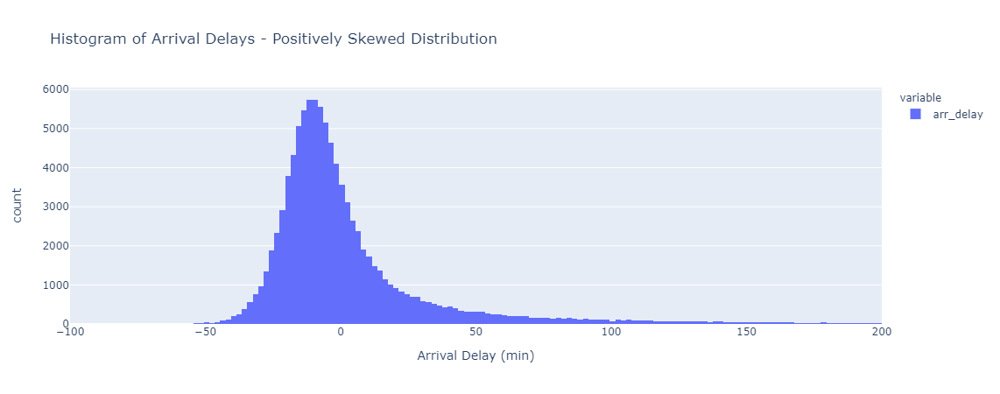

In [94]:
fig1.show()

In [71]:
from scipy.stats import kstest
kstest(flights_sample['arr_delay'].dropna(), 'norm')

KstestResult(statistic=0.5845697269166206, pvalue=0.0)

In [67]:
distribution_dict = {'Mean of Delays': flights_sample['arr_delay'].mean(),
                     'Median of Delays': flights_sample['arr_delay'].median(),
                     'Mode of Delays': flights_sample['arr_delay'].mode()}

In [68]:
pd.DataFrame(distribution_dict)

,Mean of Delays,Median of Delays,Mode of Delays
0,5.557749,-6.0,-8.0


#### The distribution is positivley skewed. As such, median and mode will be better predictors than mean

### Planes fly faster when there is a departure delay

In [86]:
flights_durations = flights_sample[['dep_delay', 'distance', 'air_time']].dropna()
flights_durations['avg_speed'] = (flights_durations['distance'] / flights_durations['air_time']) * 60
flights_durations

,dep_delay,distance,air_time,avg_speed
0,12.0,986,149.0,397.046980
1,-3.0,361,56.0,386.785714
2,3.0,592,98.0,362.448980
3,0.0,1235,170.0,435.882353
4,3.0,1721,226.0,456.902655
...,...,...,...,...
99990,10.0,581,86.0,405.348837
99992,77.0,1024,128.0,480.000000
99993,54.0,325,56.0,348.214286
99994,2.0,392,68.0,345.882353


In [89]:
fig2 = px.scatter(x=flights_durations['dep_delay'],
                  y=flights_durations['avg_speed'],
                  labels={'x': 'Departure Delay (min)',
                          'y': 'Avg Velocity (Km/Hr)'},
                  range_x=(-40, 600),
                  title='Departure Delay vs Avg Flight Speed')

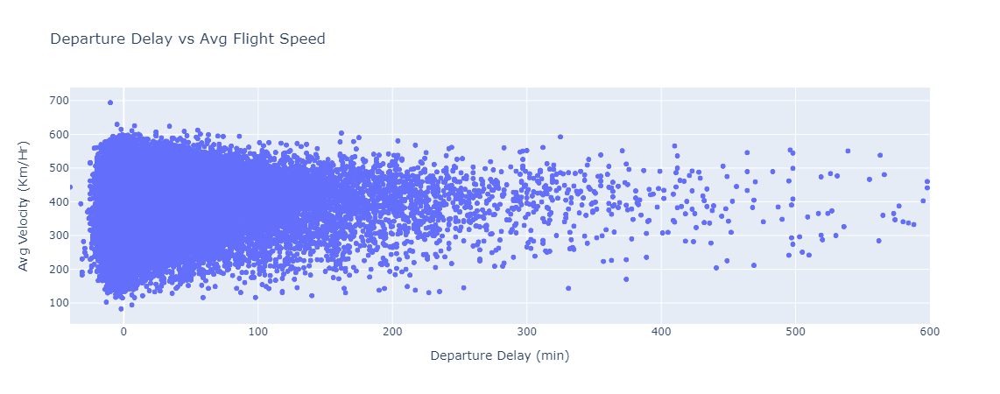

In [90]:
fig2.show()

#### It is clear that the average flight speed has no correlation with departure delay.

### Time of year

In [6]:
flights_sample = make_datetime(flights_sample)

Converting fl_date...
Formatting crs_dep_time for datetime object conversion...
Formatting crs_arr_time for datetime object conversion...
Complete! Converted df returned.


In [7]:
flights_sample_avg_monthly_delay = flights_sample.groupby(by=[flights_sample['fl_date'].dt.month]).mean()['arr_delay']
flights_sample_med_monthly_delay = flights_sample.groupby(by=[flights_sample['fl_date'].dt.month]).median()['arr_delay']
flights_sample_monthly_flights = flights_sample.groupby(by=[flights_sample['fl_date'].dt.month]).sum()['flights']

In [8]:
flights_sample_avg_hourly_dep_delay = flights_sample.groupby(by=[flights_sample['crs_dep_time'].dt.hour]).mean()['arr_delay']
flights_sample_med_hourly_dep_delay = flights_sample.groupby(by=[flights_sample['crs_dep_time'].dt.hour]).median()['arr_delay']
flights_sample_hourly_dep_flights = flights_sample.groupby(by=[flights_sample['crs_dep_time'].dt.hour]).sum()['flights']

In [9]:
flights_sample_avg_hourly_arr_delay = flights_sample.groupby(by=[flights_sample['crs_arr_time'].dt.hour]).mean()['arr_delay']
flights_sample_med_hourly_arr_delay = flights_sample.groupby(by=[flights_sample['crs_arr_time'].dt.hour]).median()['arr_delay']
flights_sample_hourly_arr_flights = flights_sample.groupby(by=[flights_sample['crs_arr_time'].dt.hour]).sum()['flights']

In [14]:
fig3 = px.bar(x=flights_sample_avg_monthly_delay.index, 
              y=flights_sample_avg_monthly_delay.values,
             labels={'x': 'Month',
                    'y': 'Average Arrival Delay (min)'},
             title='Monthly Average Arrival Delays')

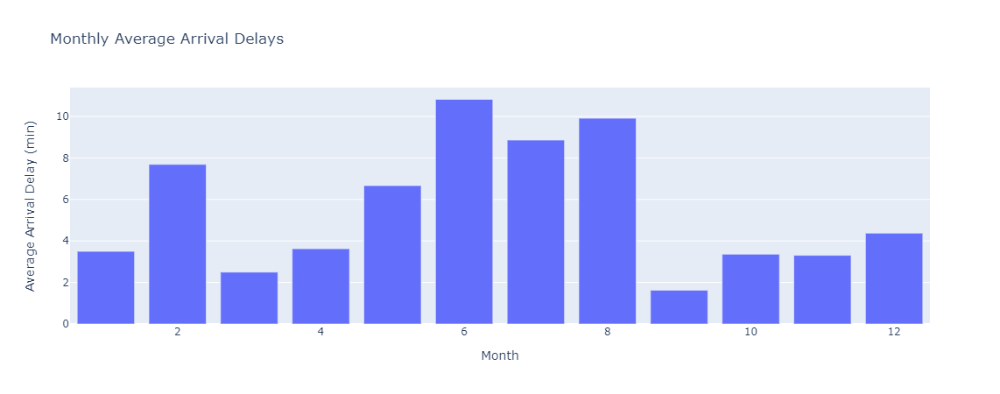

In [16]:
fig3.show()

In [51]:
fig4 = px.bar(x=flights_sample_med_monthly_delay.index, 
              y=flights_sample_med_monthly_delay.values,
             labels={'x': 'Month',
                    'y': 'Median Arrival Delay (min)'},
             title='Monthly Median Arrival Delays By Departure Times')

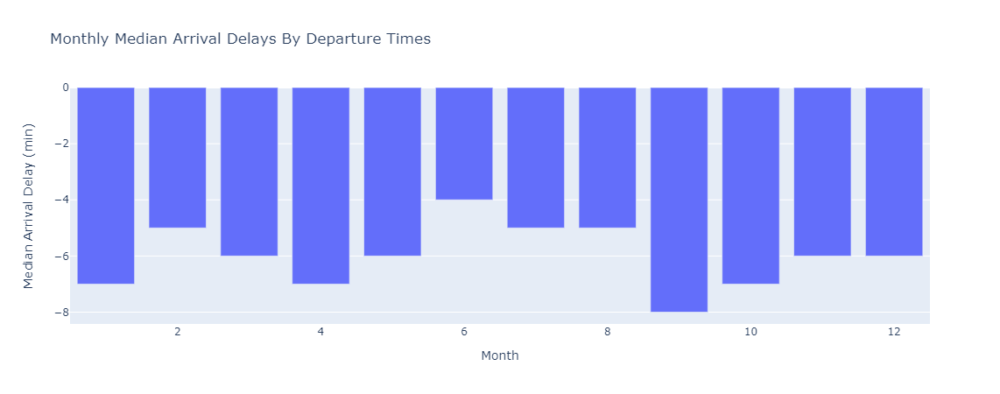

In [52]:
fig4.show()

In [25]:
fig5 = px.bar(x=flights_sample_monthly_flights.index, 
              y=flights_sample_monthly_flights.values,
             labels={'x': 'Month',
                    'y': 'Total Flights'},
             title='Monthly Flights')

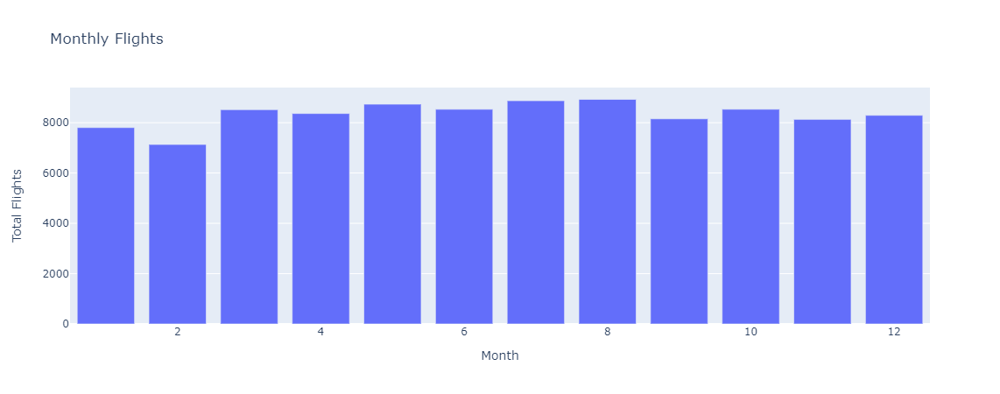

In [26]:
fig5.show()

In [37]:
fig6 = px.bar(x=flights_sample_avg_hourly_dep_delay.index, 
              y=flights_sample_avg_hourly_dep_delay.values,
             labels={'x': 'Departure Hour',
                    'y': 'Avg Arrival Delay (min)'},
             title='Avg Hourly Arrival Delay By Departure Time')

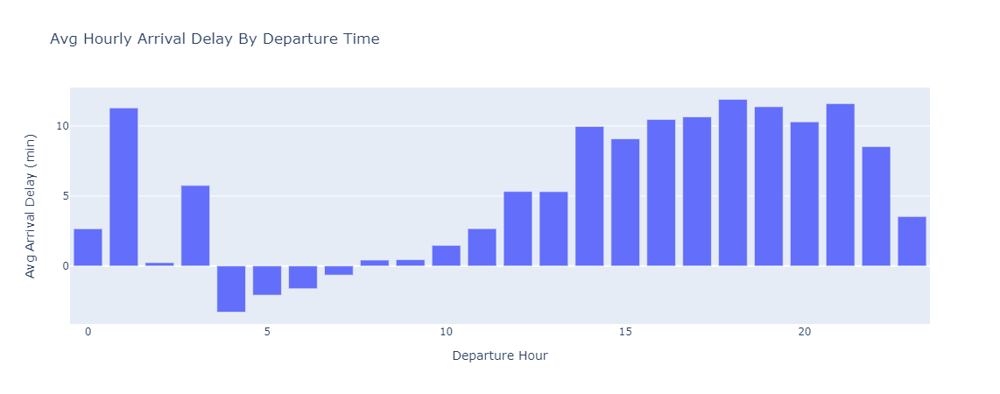

In [38]:
fig6.show()

In [35]:
fig7 = px.bar(x=flights_sample_med_hourly_dep_delay.index, 
              y=flights_sample_med_hourly_dep_delay.values,
             labels={'x': 'Departure Hour',
                    'y': 'Median Arrival Delay (min)'},
             title='Median Hourly Arrival Delay By Departure Time')

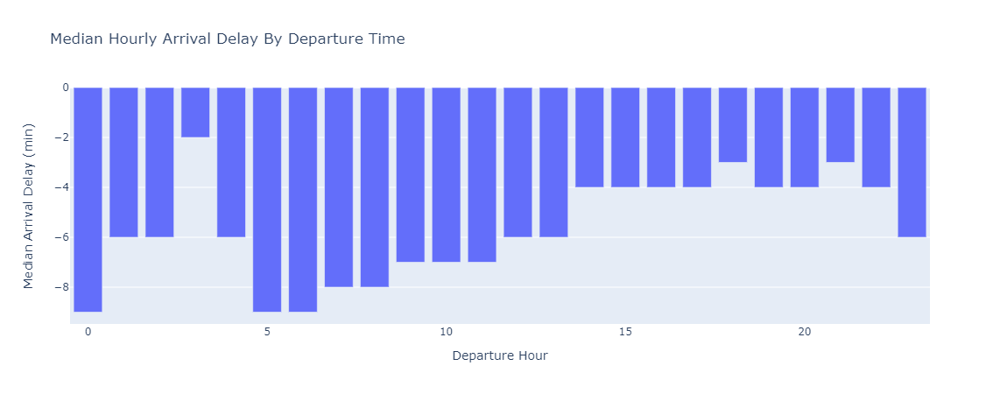

In [36]:
fig7.show()

In [49]:
fig8 = px.bar(x=flights_sample_hourly_dep_flights.index, 
              y=flights_sample_hourly_dep_flights.values,
             labels={'x': 'Departure Hour',
                    'y': 'Total Flights'},
             title='Total Departing Flights By Hour')

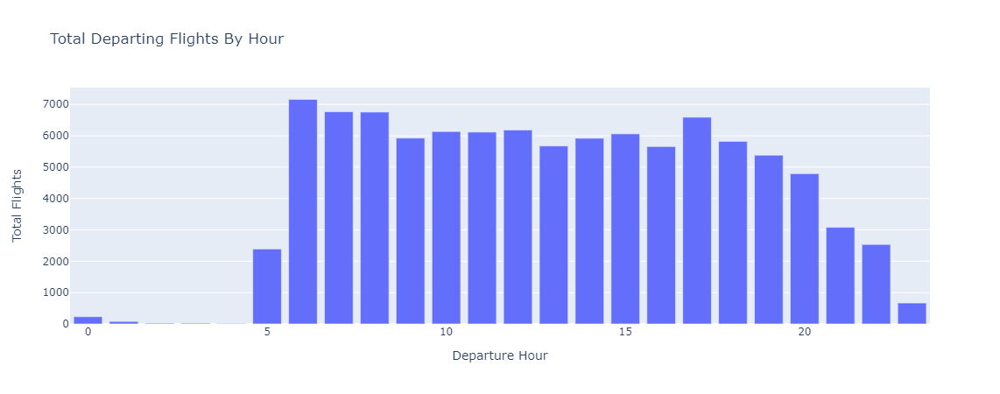

In [50]:
fig8.show()

In [39]:
fig9 = px.bar(x=flights_sample_avg_hourly_arr_delay.index, 
              y=flights_sample_avg_hourly_arr_delay.values,
             labels={'x': 'Arrival Hour',
                    'y': 'Avg Arrival Delay (min)'},
             title='Avg Hourly Arrival Delay By Arrival Time')

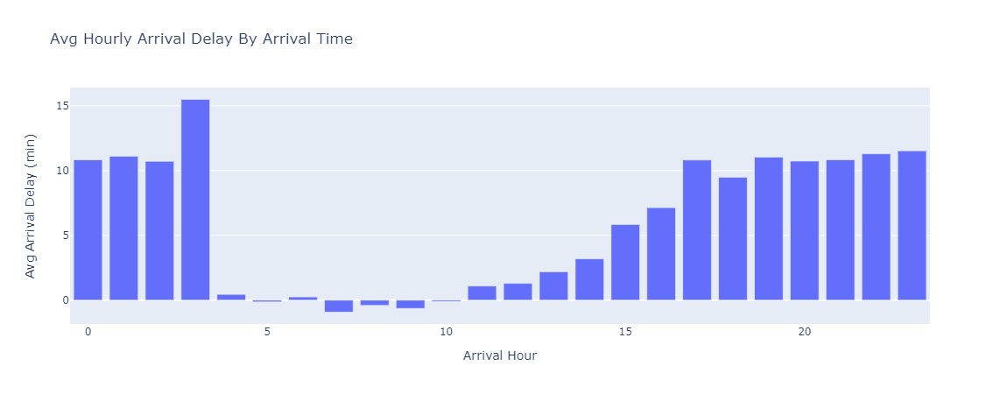

In [40]:
fig9.show()

In [41]:
fig10 = px.bar(x=flights_sample_med_hourly_arr_delay.index, 
              y=flights_sample_med_hourly_arr_delay.values,
             labels={'x': 'Arrival Hour',
                    'y': 'Median Arrival Delay (min)'},
             title='Median Hourly Arrival Delay By Arrival Time')

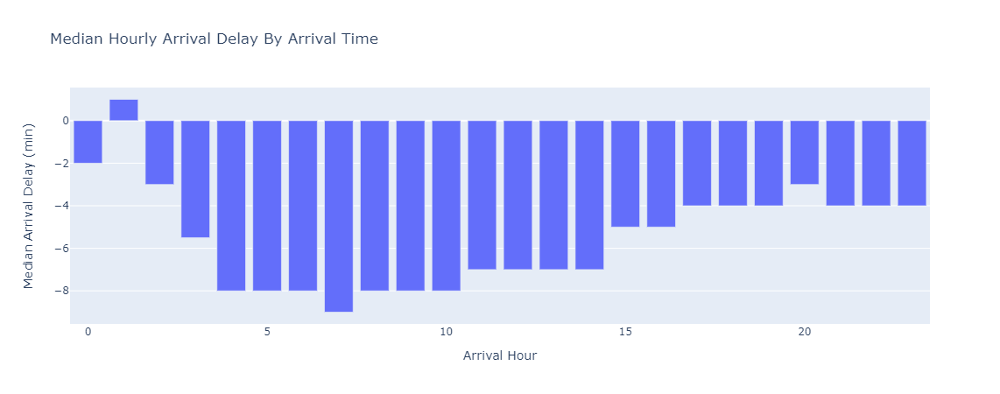

In [42]:
fig10.show()

In [47]:
fig11 = px.bar(x=flights_sample_hourly_arr_flights.index, 
              y=flights_sample_hourly_arr_flights.values,
             labels={'x': 'Arrival Hour',
                    'y': 'Total Flights'},
             title='Total Arriving Flights By Hour')

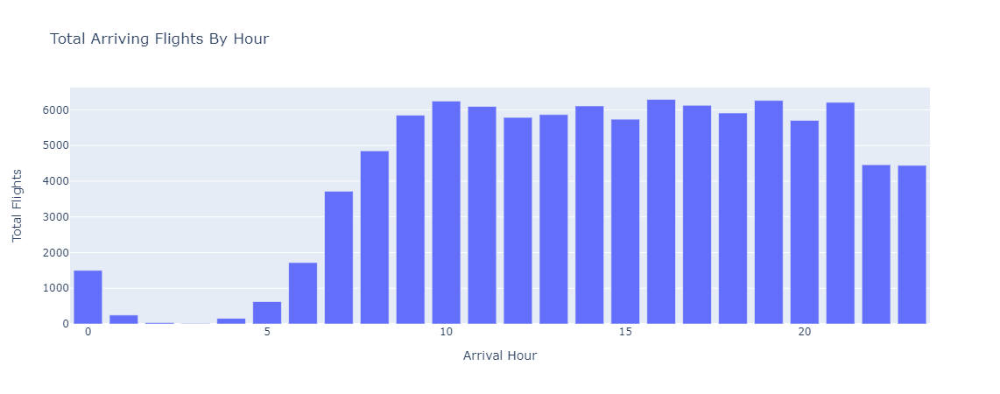

In [48]:
fig11.show()

#### There exists a strong causation between time of day/year and arrival delays
#### There exists a strong correlation between number of flights(traffic) and arrival delays

### Other relationships and insights

- States with higher traffic have higher delays.
- Didn't get a chance to check if flight duration has an effect on flight delays.

In [55]:
state_hourly_med_arr = pd.read_csv('../Feature Engineering/delay idx tables/state_arr_median_hourly_delays.csv', sep=';', index_col=0)
state_hourly_med_dep = pd.read_csv('../Feature Engineering/delay idx tables/state_dep_median_hourly_delays.csv', sep=';', index_col=0)
state_monthly_med_arr = pd.read_csv('../Feature Engineering/delay idx tables/state_arr_median_monthly_delays.csv', sep=';', index_col=0)
state_monthly_med_dep = pd.read_csv('../Feature Engineering/delay idx tables/state_dep_median_monthly_delays.csv', sep=';', index_col=0)

In [61]:
state_hourly_med_arr

,Destination State,Scheduled Arrival (Hour),Hourly Arrival Delay(Median)
0,AK,0,-12.50
1,AK,1,0.00
2,AK,2,-8.00
3,AK,3,4.00
4,AK,4,3.50
...,...,...,...
1041,WY,18,-8.00
1042,WY,19,0.50
1043,WY,20,-1.25
1044,WY,21,-7.00


In [133]:
state_daily_avg_med_arr = state_hourly_med_arr.groupby(by='Destination State').mean().sort_values(by='Hourly Arrival Delay(Median)')
state_daily_avg_med_dep = state_hourly_med_dep.groupby(by='Origin State').mean()
state_yearly_avg_med_arr = state_monthly_med_arr.groupby(by='Destination State').mean()
state_yearly_avg_med_dep = state_monthly_med_dep.groupby(by='Origin State').mean()

In [139]:
state_daily_avg_med_dep = state_daily_avg_med_dep.reindex(index=state_daily_avg_med_arr.index)
state_yearly_avg_med_arr = state_yearly_avg_med_arr.reindex(index=state_daily_avg_med_arr.index)
state_yearly_avg_med_dep = state_yearly_avg_med_dep.reindex(index=state_daily_avg_med_arr.index)

In [142]:
fig12 = px.bar(x=state_daily_avg_med_arr.index,
               y=state_daily_avg_med_arr['Hourly Arrival Delay(Median)'],
              labels={'x': 'Destination State',
                     'y': 'Avg Daily Median Delay (min)'},
              title='Average Daily Median Arrival Delay By Destination State')

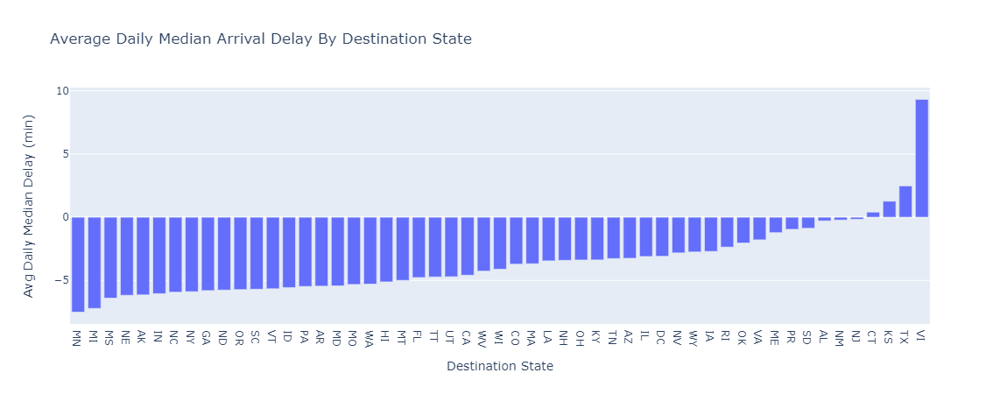

In [143]:
fig12.show()

In [144]:
fig13 = px.bar(x=state_daily_avg_med_dep.index,
               y=state_daily_avg_med_dep['Hourly Arrival Delay(Median)'],
              labels={'x': 'Origin State',
                     'y': 'Avg Daily Median Delay (min)'},
              title='Average Daily Median Arrival Delay By Arrival State')

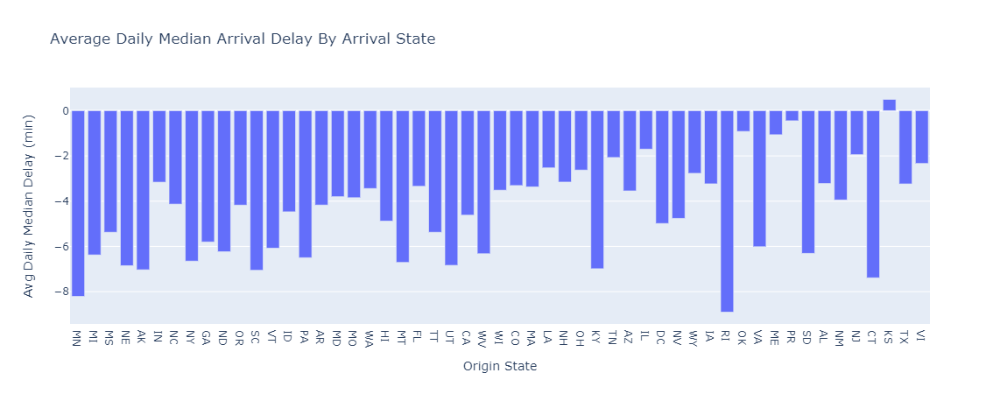

In [145]:
fig13.show()

In [146]:
fig14 = px.bar(x=state_yearly_avg_med_arr.index,
               y=state_yearly_avg_med_arr['Monthly Arrival Delay(Median)'],
              labels={'x': 'Destination State',
                     'y': 'Avg Annual Median Delay (min)'},
              title='Average Annual Median Arrival Delay By Destination State')

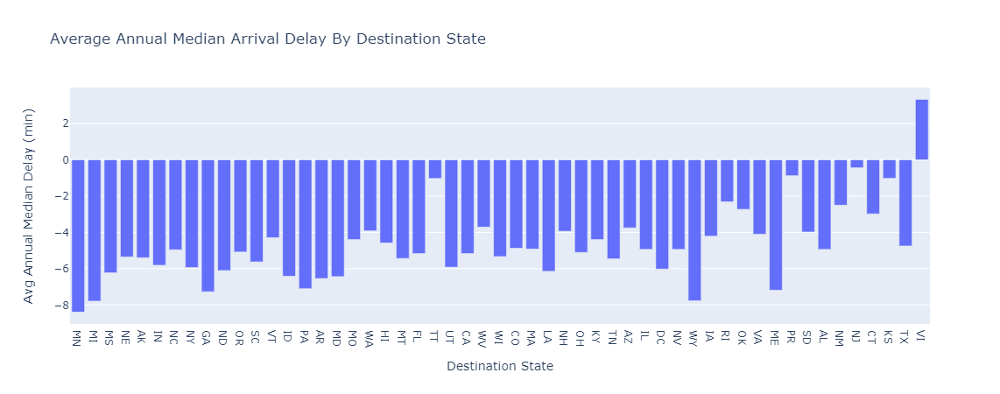

In [147]:
fig14.show()

In [148]:
fig15 = px.bar(x=state_yearly_avg_med_dep.index,
               y=state_yearly_avg_med_dep['Monthly Arrival Delay(Median)'],
              labels={'x': 'Origin State',
                     'y': 'Avg Annual Median Delay (min)'},
              title='Average Annual Median Arrival Delay By Origin State')

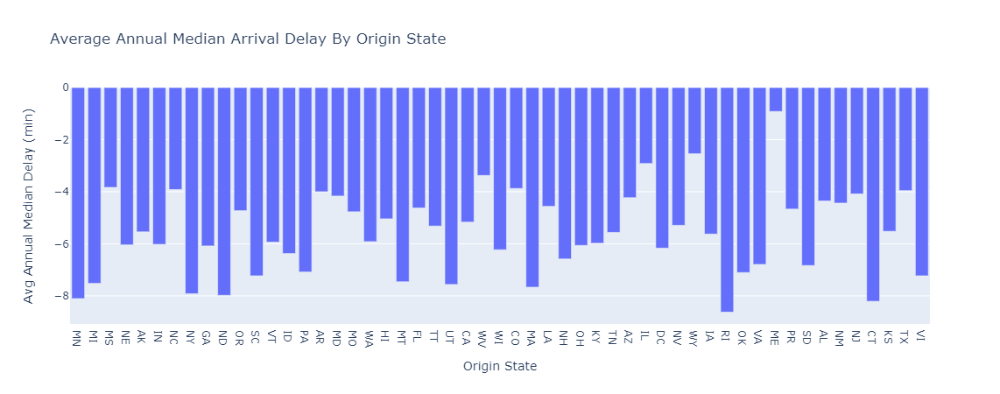

In [149]:
fig15.show()

#### There is strong causation between state and arrival delays

In [106]:
total_dep_flights_state = flights_sample.groupby(by=[flights_sample['origin_city_name']]).count()#['flights']
total_arr_flights_state = flights_sample.groupby(by=[flights_sample['dest_city_name']]).count()#['flights']

total_dep_flights_state.reset_index(inplace=True)
total_arr_flights_state.reset_index(inplace=True)

In [108]:
for i in range(len(total_dep_flights_state)):
    total_dep_flights_state['origin_city_name'][i] = total_dep_flights_state['origin_city_name'][i][-2:]

<ipython-input-108-570aa615e4ae>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [110]:
for i in range(len(total_arr_flights_state)):
    total_arr_flights_state['dest_city_name'][i] = total_arr_flights_state['dest_city_name'][i][-2:]

<ipython-input-110-6f6e0620c6db>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [116]:
total_dep_flights_state = total_dep_flights_state.groupby(by='origin_city_name').sum()['flights']

KeyError: 'flights'

In [120]:
total_dep_flights_state = total_dep_flights_state.reindex(index=state_yearly_avg_med_arr)

In [121]:
total_arr_flights_state = total_arr_flights_state.groupby(by='dest_city_name').sum()['flights']

In [122]:
total_arr_flights_state = total_arr_flights_state.sort_values()

In [153]:
len(total_arr_flights_state)

53

In [156]:
total_dep_flights_state = total_dep_flights_state.reindex(index=state_daily_avg_med_arr.index)
total_arr_flights_state = total_arr_flights_state.reindex(index=state_daily_avg_med_arr.index)

In [161]:
fig16 = px.bar(x=total_dep_flights_state.index,
               y=total_dep_flights_state.values,
              labels={'x': 'Origin State',
                     'y': 'Total Flights'},
              title='Total Departing Flights by State')

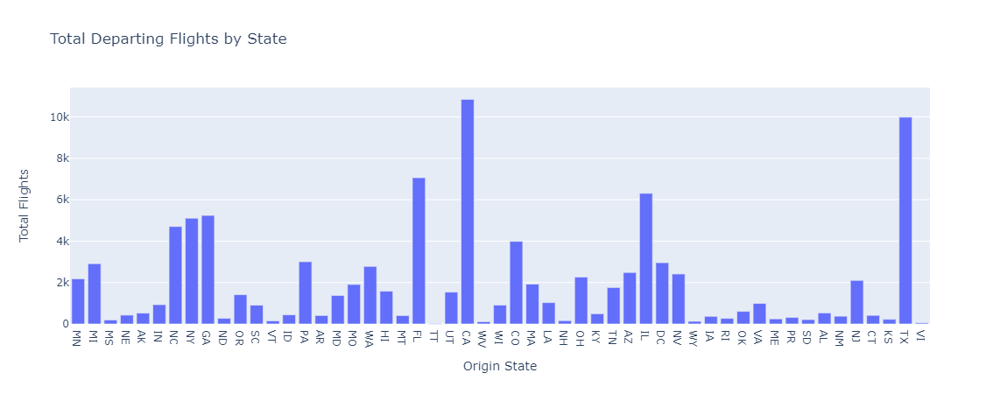

In [162]:
fig16.show()

In [159]:
fig17 = px.bar(x=total_arr_flights_state.index,
               y=total_arr_flights_state.values,
              labels={'x': 'Destination State',
                     'y': 'Total Flights'},
              title='Total Arriving Flights by State')

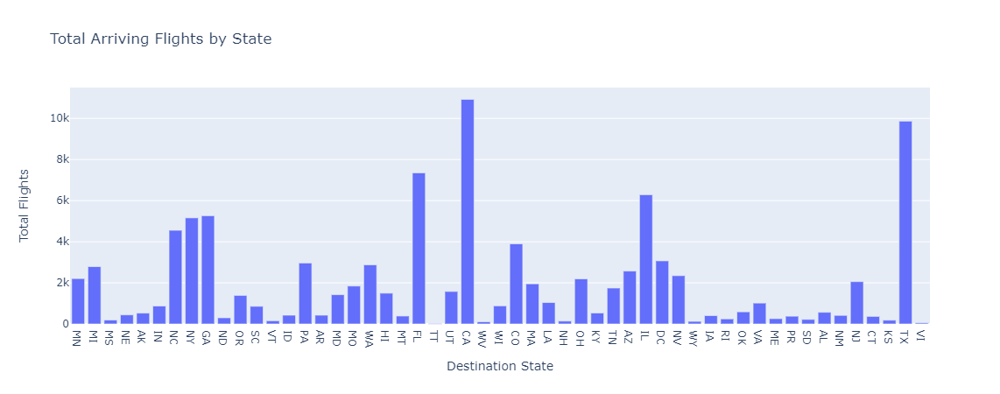

In [160]:
fig17.show()

### Departure Delay

In [165]:
fig18 = px.scatter(x=flights_sample['dep_delay'],
                  y=flights_sample['arr_delay'],
                  labels={'x': 'Departure Delay (min)',
                         'y': 'Arrival Delay'},
                  title='Departure Delay vs Arrival Delay')

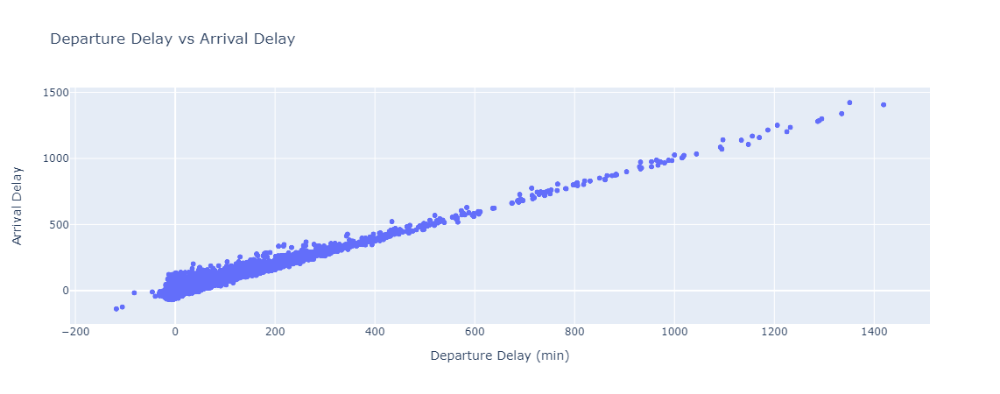

In [166]:
fig18.show()

#### There is an extremely high correlation between departure and arrival delays